importing essential libraries and packages



In [ ]:
# Install YOLOv8
!pip install ultralytics -q

# Import the library
from ultralytics import YOLO
import torch

# Check device
device = "cuda" if torch.cuda.is_available() else "cpu"
print("Using device:", device)


Using device: cuda


mounting the google drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
Extracting The Data

In [ ]:
# Example dataset path
dataset_path = "/content/drive/MyDrive/data"

# Check dataset files
!ls {dataset_path}


data.yaml  test  train	val


creating the data.yaml file for ['Fire Extinguisher', 'Toolbox', 'Oxygen Tank'] and train test validate allotment

In [ ]:
yaml_content = """
train: /content/drive/MyDrive/data/train/images
val: /content/drive/MyDrive/data/val/images
test: /content/drive/MyDrive/data/test/images

nc: 3
names: ['Fire Extinguisher', 'Toolbox', 'Oxygen Tank']

"""

with open("/content/drive/MyDrive/data/data.yaml", "w") as f:
    f.write(yaml_content)

print("✅ data.yaml created successfully!")


✅ data.yaml created successfully!


checking if its installed or not

In [ ]:
!cat /content/drive/MyDrive/data/data.yaml



train: /content/drive/MyDrive/data/train/images
val: /content/drive/MyDrive/data/val/images
test: /content/drive/MyDrive/data/test/images

nc: 3
names: ['Fire Extinguisher', 'Toolbox', 'Oxygen Tank']



Importing and using the YOLO model from the ultralytics

In [ ]:
from ultralytics import YOLO

model = YOLO("yolov8n.pt")

model.train(
    data="/content/drive/MyDrive/data/data.yaml",
    epochs=30,
    imgsz=640,
    batch=16,
    device=0
)



Ultralytics 8.3.173 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/data/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=30, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, pose=12.0, pret

Overriding model.yaml nc=80 with nc=3

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

 22        [15, 18, 21]  1    751897  ultralytics.nn.modules.head.Detect           [3, [64, 128, 256]]           
Model summary: 129 layers, 3,011,433 parameters, 3,011,417 gradients, 8.2 GFLOPs

Transferred 319/355 items from pretrained weights
Freezing layer 'model.22.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks...


AMP: checks passed ✅
train: Fast image access ✅ (ping: 0.4±0.1 ms, read: 5.5±3.0 MB/s, size: 2538.9 KB)


train: Scanning /content/drive/MyDrive/data/train/labels.cache... 846 images, 6 backgrounds, 0 corrupt: 100%|██████████| 847/847 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.4±0.1 ms, read: 54.9±112.0 MB/s, size: 3015.9 KB)


val: Scanning /content/drive/MyDrive/data/val/labels.cache... 154 images, 0 backgrounds, 0 corrupt: 100%|██████████| 154/154 [00:00<?, ?it/s]


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001429, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/30         2G     0.9915      2.632      1.104         30        640: 100%|██████████| 53/53 [05:19<00:00,  6.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.18s/it]

                   all        154        206      0.984      0.346      0.708      0.521



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/30      2.11G     0.9809      1.667      1.097         48        640: 100%|██████████| 53/53 [00:57<00:00,  1.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.12it/s]

                   all        154        206      0.775      0.576      0.697      0.533



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/30      2.11G     0.9553      1.506      1.096         46        640: 100%|██████████| 53/53 [00:53<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.04it/s]

                   all        154        206      0.806      0.676      0.749      0.554



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/30      2.11G     0.9927      1.384      1.098         31        640: 100%|██████████| 53/53 [00:52<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:06<00:00,  1.35s/it]

                   all        154        206      0.774      0.731      0.759      0.571



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/30      2.11G     0.9485      1.239      1.083         36        640: 100%|██████████| 53/53 [00:51<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:06<00:00,  1.30s/it]

                   all        154        206      0.773      0.748      0.791      0.612



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/30      2.11G     0.9206      1.103      1.068         41        640: 100%|██████████| 53/53 [00:53<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.29it/s]

                   all        154        206      0.877      0.699      0.771      0.601



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/30      2.11G     0.9079      1.007       1.06         46        640: 100%|██████████| 53/53 [00:53<00:00,  1.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.06it/s]

                   all        154        206      0.927      0.829      0.881      0.699



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/30      2.11G     0.8463     0.9323      1.042         34        640: 100%|██████████| 53/53 [00:52<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.01s/it]

                   all        154        206      0.958      0.796      0.887       0.73



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/30      2.12G     0.8092     0.8501      1.027         42        640: 100%|██████████| 53/53 [00:52<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.08s/it]

                   all        154        206      0.886      0.857      0.887      0.734



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/30      2.12G     0.8118     0.8426       1.02         28        640: 100%|██████████| 53/53 [00:51<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.03it/s]

                   all        154        206      0.957      0.851      0.914      0.748



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/30      2.14G     0.7876     0.7952      1.013         40        640: 100%|██████████| 53/53 [00:52<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.07s/it]

                   all        154        206      0.904      0.842      0.884      0.713



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/30      2.14G     0.7757     0.7658      1.006         44        640: 100%|██████████| 53/53 [00:52<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.18s/it]

                   all        154        206      0.928      0.825      0.885      0.729



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/30      2.16G     0.7304      0.726     0.9989         35        640: 100%|██████████| 53/53 [00:52<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.07it/s]

                   all        154        206      0.975      0.811      0.893      0.755



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/30      2.16G       0.73     0.6945     0.9841         33        640: 100%|██████████| 53/53 [00:54<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.24it/s]

                   all        154        206      0.922      0.883      0.904      0.766



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/30      2.16G     0.7374     0.7056     0.9883         35        640: 100%|██████████| 53/53 [00:53<00:00,  1.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.30it/s]

                   all        154        206      0.965      0.886      0.916      0.761



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/30      2.18G     0.6977     0.6661     0.9668         38        640: 100%|██████████| 53/53 [00:52<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.00it/s]

                   all        154        206      0.946      0.857      0.911      0.789



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/30      2.18G     0.7165     0.6603     0.9871         48        640: 100%|██████████| 53/53 [00:53<00:00,  1.00s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.06it/s]

                   all        154        206      0.976      0.879      0.909      0.782



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/30      2.19G     0.6576     0.6243      0.956         37        640: 100%|██████████| 53/53 [00:52<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.16s/it]

                   all        154        206       0.95      0.873      0.917      0.787



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/30       2.2G      0.666     0.6278     0.9646         32        640: 100%|██████████| 53/53 [00:51<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.18s/it]

                   all        154        206      0.955      0.854       0.92        0.8



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/30      2.21G     0.6189     0.5679     0.9479         46        640: 100%|██████████| 53/53 [00:52<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.06s/it]

                   all        154        206       0.96      0.899      0.925       0.81


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/30      2.21G     0.5266     0.5441     0.8685         21        640: 100%|██████████| 53/53 [00:57<00:00,  1.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.19it/s]

                   all        154        206       0.93      0.876      0.927      0.816



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/30      2.21G     0.5232     0.5261     0.8783         18        640: 100%|██████████| 53/53 [00:51<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.05s/it]

                   all        154        206      0.939      0.872      0.909      0.798



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/30      2.21G     0.5238     0.4803     0.8673         18        640: 100%|██████████| 53/53 [00:51<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.13s/it]

                   all        154        206       0.96      0.873      0.928      0.816



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/30      2.21G     0.4972     0.4704     0.8585         19        640: 100%|██████████| 53/53 [00:50<00:00,  1.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:06<00:00,  1.32s/it]

                   all        154        206      0.921      0.886      0.921      0.804



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/30      2.21G     0.4727     0.4438     0.8532         20        640: 100%|██████████| 53/53 [00:51<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.05s/it]

                   all        154        206      0.966      0.861      0.933      0.822



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/30      2.21G     0.4476     0.4336     0.8444         17        640: 100%|██████████| 53/53 [00:50<00:00,  1.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.11s/it]

                   all        154        206      0.945      0.888      0.926      0.822



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/30      2.21G      0.457     0.4222      0.846         21        640: 100%|██████████| 53/53 [00:52<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.32it/s]

                   all        154        206      0.971      0.894      0.933      0.835



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/30      2.21G     0.4301     0.4008     0.8382         16        640: 100%|██████████| 53/53 [00:51<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.07it/s]

                   all        154        206      0.991      0.869      0.934      0.841



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/30      2.21G     0.4199     0.3866     0.8306         21        640: 100%|██████████| 53/53 [00:52<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.16it/s]

                   all        154        206      0.982      0.884      0.936      0.849



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/30      2.21G     0.4035     0.3839      0.828         21        640: 100%|██████████| 53/53 [00:52<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.14it/s]

                   all        154        206          1       0.88      0.936      0.853



30 epochs completed in 0.563 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train/weights/best.pt, 6.2MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.173 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,006,233 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:06<00:00,  1.28s/it]


                   all        154        206          1       0.88      0.936      0.852
     Fire Extinguisher         67         67          1      0.938      0.959      0.856
               Toolbox         60         60          1      0.869      0.918      0.892
           Oxygen Tank         79         79          1      0.832      0.931      0.809
Speed: 0.2ms preprocess, 1.9ms inference, 0.0ms loss, 2.8ms postprocess per image
Results saved to runs/detect/train


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7aa8327abc90>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.04

In [ ]:
# Evaluate model on validation set
metrics = model.val()
print(metrics)  # includes mAP, precision, recall


Ultralytics 8.3.173 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,006,233 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.4±0.2 ms, read: 376.3±320.2 MB/s, size: 3039.4 KB)


val: Scanning /content/drive/MyDrive/data/val/labels.cache... 154 images, 0 backgrounds, 0 corrupt: 100%|██████████| 154/154 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:08<00:00,  1.22it/s]


                   all        154        206          1      0.881      0.936      0.852
     Fire Extinguisher         67         67          1      0.939      0.959      0.854
               Toolbox         60         60          1       0.87      0.918      0.892
           Oxygen Tank         79         79          1      0.833      0.931       0.81
Speed: 1.7ms preprocess, 3.7ms inference, 0.0ms loss, 1.9ms postprocess per image
Results saved to runs/detect/train2
ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7aa8b76b0650>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,   

check where the weights are saved

In [ ]:
!ls runs/detect/



train  train2


In [ ]:
!ls runs/detect/*/weights/

best.pt  last.pt


predict images

In [ ]:
# Predict on test images
results = model.predict(source=f"{dataset_path}/test/images", save=True, conf=0.5)

# The predictions will be saved in runs/detect/predict



image 1/400 /content/drive/MyDrive/data/test/images/000000000.png: 384x640 1 Oxygen Tank, 44.2ms
image 2/400 /content/drive/MyDrive/data/test/images/000000001.png: 384x640 1 Toolbox, 7.6ms
image 3/400 /content/drive/MyDrive/data/test/images/000000002.png: 384x640 1 Fire Extinguisher, 1 Toolbox, 6.9ms
image 4/400 /content/drive/MyDrive/data/test/images/000000003.png: 384x640 1 Toolbox, 7.2ms
image 5/400 /content/drive/MyDrive/data/test/images/000000004.png: 384x640 1 Oxygen Tank, 27.3ms
image 6/400 /content/drive/MyDrive/data/test/images/000000005.png: 384x640 1 Toolbox, 8.4ms
image 7/400 /content/drive/MyDrive/data/test/images/000000006.png: 384x640 1 Toolbox, 8.2ms
image 8/400 /content/drive/MyDrive/data/test/images/000000007.png: 384x640 1 Fire Extinguisher, 1 Toolbox, 1 Oxygen Tank, 15.3ms
image 9/400 /content/drive/MyDrive/data/test/images/000000008.png: 384x640 1 Oxygen Tank, 8.5ms
image 10/400 /content/drive/MyDrive/data/test/images/000000009.png: 384x640 1 Toolbox, 12.2ms
image

In [ ]:
!ls runs/detect/

train  train2  train3


In [ ]:
!ls runs/detect/*/weights/

best.pt  last.pt


Creating the confusion matrix and the confusion table

Ultralytics 8.3.173 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,006,233 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.3±0.1 ms, read: 90.2±48.9 MB/s, size: 2595.1 KB)


val: Scanning /content/drive/MyDrive/data/val/labels.cache... 154 images, 0 backgrounds, 0 corrupt: 100%|██████████| 154/154 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:11<00:00,  1.16s/it]


                   all        154        206          1      0.881      0.936      0.852
     Fire Extinguisher         67         67          1      0.939      0.959      0.854
               Toolbox         60         60          1       0.87      0.918      0.892
           Oxygen Tank         79         79          1      0.833      0.931       0.81
Speed: 0.5ms preprocess, 2.9ms inference, 0.0ms loss, 3.3ms postprocess per image
Results saved to runs/detect/val

📊 Performance Summary:
    mAP@0.5  mAP@0.5-0.95  Precision  Recall
0    0.936         0.852        1.0   0.881


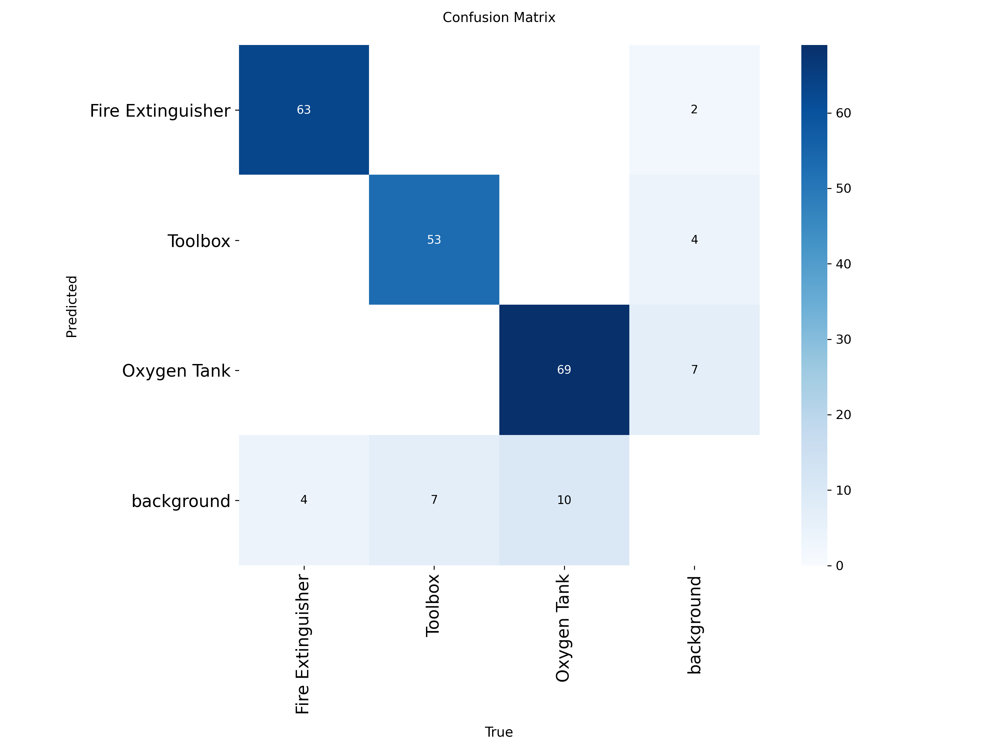

In [ ]:
# from ultralytics import YOLO
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Load best model
model = YOLO("runs/detect/train/weights/best.pt")

# Run validation to get full metrics (including confusion matrix)
metrics = model.val(data="/content/drive/MyDrive/data/data.yaml", plots=True)

# Create summary table
summary = {
    "mAP@0.5": round(metrics.box.map50, 3),
    "mAP@0.5-0.95": round(metrics.box.map, 3),
    "Precision": round(metrics.box.mp, 3),
    "Recall": round(metrics.box.mr, 3)
}
df = pd.DataFrame([summary])
print("\n📊 Performance Summary:\n", df)

# The confusion matrix is already saved as a PNG
import glob
from PIL import Image

# Find and display YOLO's confusion matrix plot
cm_path = glob.glob("runs/detect/train/confusion_matrix.png")[0]
img = Image.open(cm_path)
display(img)


creating the grapfhs

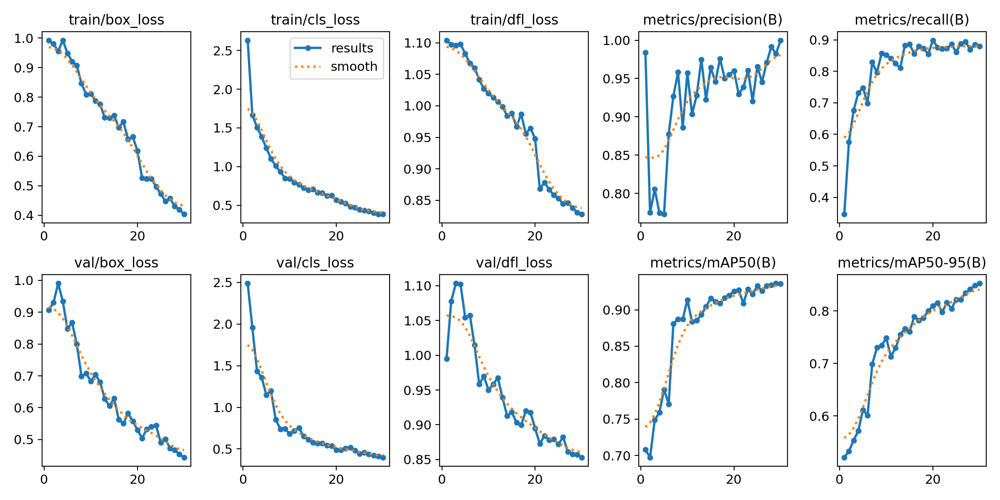

In [ ]:
import glob
from PIL import Image

# Find training results
for img_path in glob.glob("runs/detect/train*/results.png"):
    img = Image.open(img_path)
    display(img)


best model is automataically saved in the g drive

In [ ]:
!cp runs/detect/train*/weights/best.pt /content/drive/MyDrive/best.pt
print("✅ Best model saved to Google Drive as best.pt")


✅ Best model saved to Google Drive as best.pt


In [ ]:
import os

save_dir = "/content/drive/MyDrive/final_modelresult"
os.makedirs(save_dir, exist_ok=True)

print("✅ Folder created at:", save_dir)


✅ Folder created at: /content/drive/MyDrive/final_modelresult


In [ ]:
# Save model weights
model_path = "/content/drive/MyDrive/final_modelresult/best.pt"
model.save(model_path)
print("Model saved at:", model_path)


Model saved at: /content/drive/MyDrive/final_modelresult/best.pt


now we are going to test this

test images testing

In [ ]:
from ultralytics import YOLO

# Load trained model (update path to your best.pt)
model = YOLO("runs/detect/train/weights/best.pt")

# Predict on test images
results = model.predict(
    source="/content/drive/MyDrive/data/test/images",  # your test folder
    conf=0.5,    # confidence threshold
    save=True    # saves images with boxes
)



image 1/400 /content/drive/MyDrive/data/test/images/000000000.png: 384x640 1 Oxygen Tank, 14.2ms
image 2/400 /content/drive/MyDrive/data/test/images/000000001.png: 384x640 1 Toolbox, 10.5ms
image 3/400 /content/drive/MyDrive/data/test/images/000000002.png: 384x640 1 Fire Extinguisher, 1 Toolbox, 9.0ms
image 4/400 /content/drive/MyDrive/data/test/images/000000003.png: 384x640 1 Toolbox, 9.2ms
image 5/400 /content/drive/MyDrive/data/test/images/000000004.png: 384x640 1 Oxygen Tank, 14.7ms
image 6/400 /content/drive/MyDrive/data/test/images/000000005.png: 384x640 1 Toolbox, 8.5ms
image 7/400 /content/drive/MyDrive/data/test/images/000000006.png: 384x640 1 Toolbox, 14.9ms
image 8/400 /content/drive/MyDrive/data/test/images/000000007.png: 384x640 1 Fire Extinguisher, 1 Toolbox, 1 Oxygen Tank, 15.3ms
image 9/400 /content/drive/MyDrive/data/test/images/000000008.png: 384x640 1 Oxygen Tank, 8.5ms
image 10/400 /content/drive/MyDrive/data/test/images/000000009.png: 384x640 1 Toolbox, 10.2ms
ima

showing the images

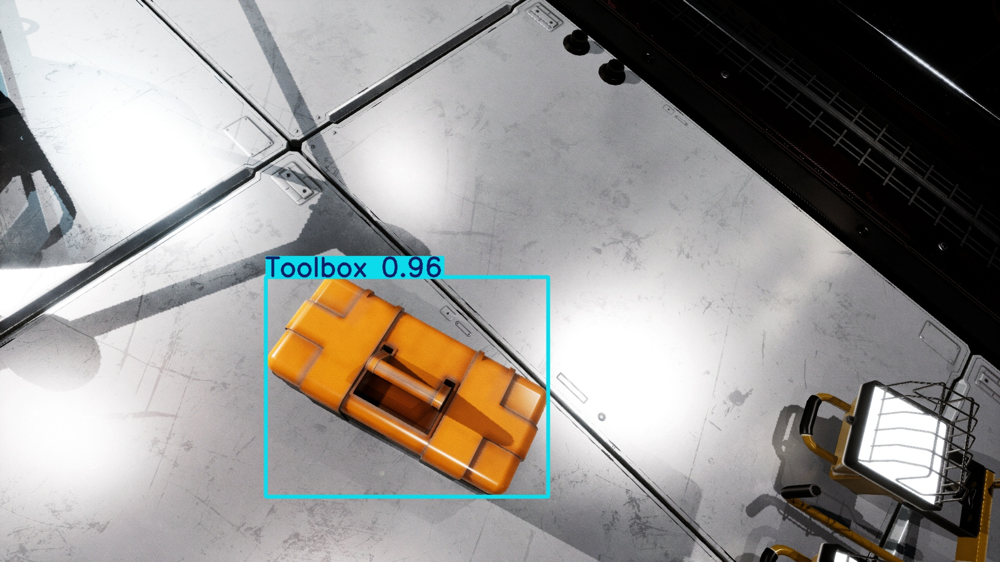

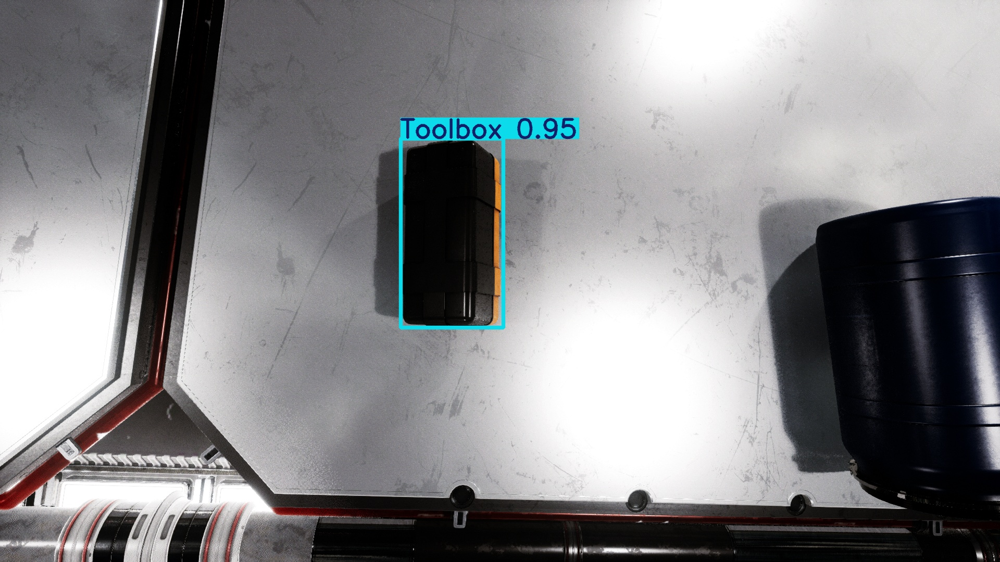

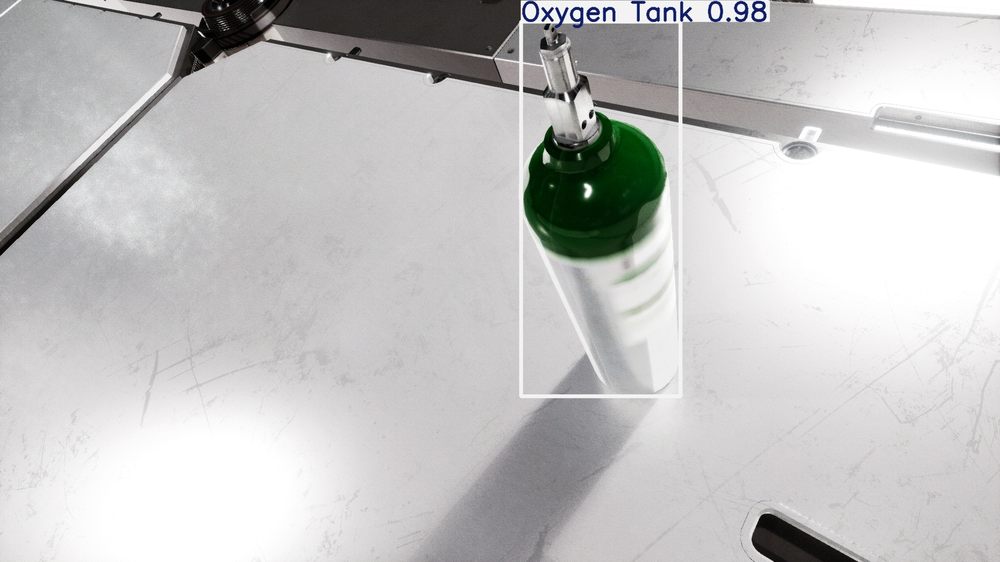

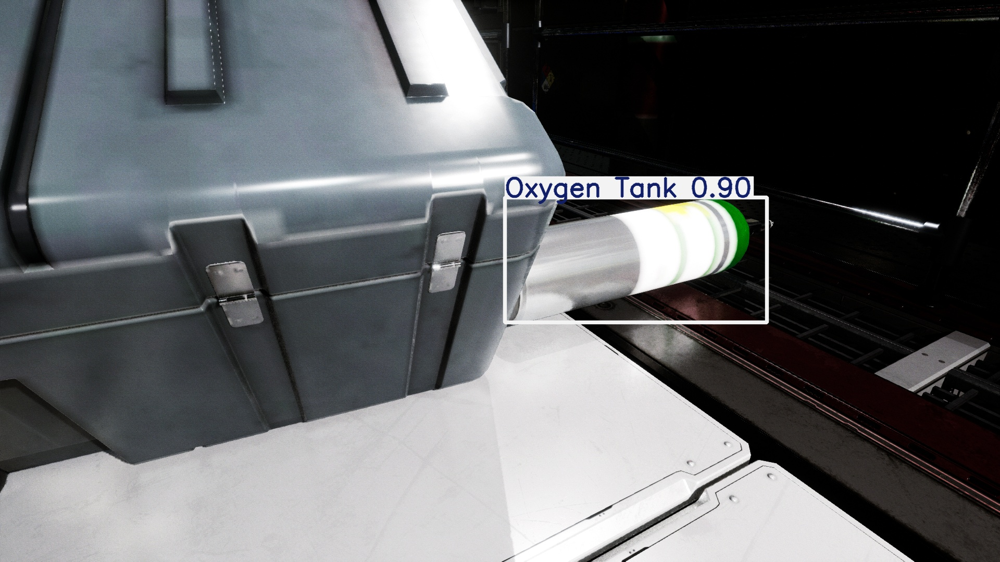

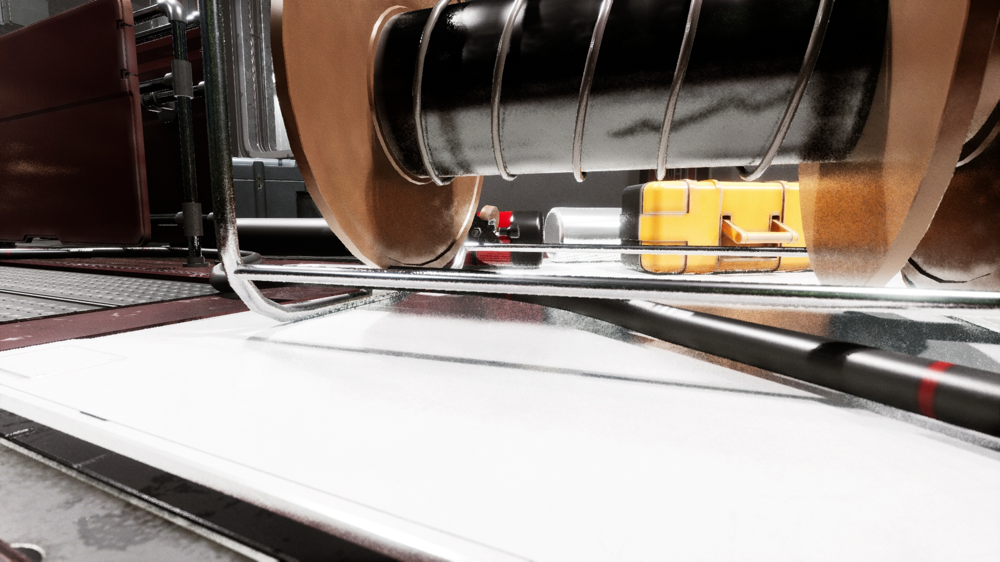

In [ ]:
import glob
from PIL import Image
from IPython.display import display

# Show first 5 predicted images
pred_paths = glob.glob("runs/detect/predict/*.jpg")[:5]
for img_path in pred_paths:
    display(Image.open(img_path))


In [ ]:
import os

save_dir = "/content/drive/MyDrive/YOLO_pridictions "
os.makedirs(save_dir, exist_ok=True)

print("✅ Folder created at:", save_dir)


✅ Folder created at: /content/drive/MyDrive/YOLO_pridictions 


In [ ]:
!cp -r runs/detect/predict /content/drive/MyDrive/YOLO_pridictions
print("✅ Annotated images saved to Google Drive")


✅ Annotated images saved to Google Drive
